In [79]:
import numpy as np;
import pandas as pd;
import seaborn as sns;
import matplotlib.pyplot as plt;
import statsmodels.formula.api as smf
import statsmodels.api as sm
import statistics
import bootstrapped.bootstrap as bs
import bootstrapped.stats_functions as bs_stats
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix  
from sklearn.metrics import roc_curve, auc
from sklearn import preprocessing
from sklearn.preprocessing import label_binarize
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from imblearn.over_sampling import SMOTE 
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsRegressor

In [80]:
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from sklearn import model_selection
from matplotlib.ticker import MultipleLocator
from itertools import cycle
import warnings
%matplotlib inline
warnings.filterwarnings('ignore')


1. The LASSO and Boosting for Regression
(a) Download the Communities and Crime data

Use the first 1495 rows of data as the training set and the rest as the test set.
(b) Use a data imputation technique to deal with the missing values in the data set. The data description mentions some features are nonpredictive. Ignore those features.¶


In [4]:
a= []
f = open("C:\\Users\\D\\Downloads\\communities.names.txt","r")
for line in f.readlines()[80:203]:
    if (line.startswith("@attribute")):
        words = line.split(" ")
        a.append(words[1])
f.close()
data = pd.read_csv("C:\\Users\\D\\Downloads\\communities.csv", sep=",",header=None).drop([0,1,2,3,4],axis=1)
data = data.replace('?',np.nan)
data = data.apply(pd.to_numeric, errors='ignore')
data = data.fillna(value=data.mean())
data.columns= range(0,123)
print(data)

       0     1     2     3     4     5     6     7     8     9    ...    113  \
0     0.19  0.33  0.02  0.90  0.12  0.17  0.34  0.47  0.29  0.32  ...   0.12   
1     0.00  0.16  0.12  0.74  0.45  0.07  0.26  0.59  0.35  0.27  ...   0.02   
2     0.00  0.42  0.49  0.56  0.17  0.04  0.39  0.47  0.28  0.32  ...   0.01   
3     0.04  0.77  1.00  0.08  0.12  0.10  0.51  0.50  0.34  0.21  ...   0.02   
4     0.01  0.55  0.02  0.95  0.09  0.05  0.38  0.38  0.23  0.36  ...   0.04   
5     0.02  0.28  0.06  0.54  1.00  0.25  0.31  0.48  0.27  0.37  ...   0.01   
6     0.01  0.39  0.00  0.98  0.06  0.02  0.30  0.37  0.23  0.60  ...   0.05   
7     0.01  0.74  0.03  0.46  0.20  1.00  0.52  0.55  0.36  0.35  ...   0.01   
8     0.03  0.34  0.20  0.84  0.02  0.00  0.38  0.45  0.28  0.48  ...   0.04   
9     0.01  0.40  0.06  0.87  0.30  0.03  0.90  0.82  0.80  0.39  ...   0.00   
10    0.13  0.71  0.15  0.07  1.00  0.41  0.40  0.52  0.35  0.33  ...   0.02   
11    0.02  0.46  0.08  0.91  0.07  0.10

(c) Plot a correlation matrix for the features in the data set.

In [5]:
corr_mat=data.corr()
print(corr_mat)

          0         1         2         3         4         5         6    \
0    1.000000 -0.046148  0.231178 -0.300845  0.181603  0.156218  0.006368   
1   -0.046148  1.000000 -0.067109 -0.235907  0.201996  0.468659  0.520461   
2    0.231178 -0.067109  1.000000 -0.794389 -0.106738 -0.066581  0.122338   
3   -0.300845 -0.235907 -0.794389  1.000000 -0.270266 -0.444166 -0.194015   
4    0.181603  0.201996 -0.106738 -0.270266  1.000000  0.266743 -0.025020   
5    0.156218  0.468659 -0.066581 -0.444166  0.266743  1.000000  0.145741   
6    0.006368  0.520461  0.122338 -0.194015 -0.025020  0.145741  1.000000   
7    0.130344  0.367338  0.153475 -0.266852  0.100727  0.205870  0.822424   
8    0.075596  0.295225  0.134068 -0.183804  0.052761  0.086343  0.894547   
9   -0.102006 -0.612666  0.052934  0.136483 -0.272020 -0.227694 -0.410958   
10   0.993112 -0.047581  0.223469 -0.295237  0.200593  0.153941 -0.021367   
11   0.239446 -0.015739 -0.001269 -0.052273  0.269380  0.038298 -0.239994   

(d) Calculate the Coefficient of Variation CV for each feature.

In [6]:
std=data.std()
mean=data.mean()
cv=std/mean
print(cv)

0      2.203503
1      0.353298
2      1.410920
3      0.323782
4      1.359162
5      1.614278
6      0.365840
7      0.290693
8      0.495161
9      0.423442
10     2.001744
11     0.638849
12     0.579753
13     0.327710
14     0.700030
15     0.359240
16     0.368513
17     0.699031
18     0.349639
19     0.527732
20     0.545633
21     0.507552
22     0.589469
23     0.809685
24     0.606194
25     0.670645
26     0.473960
27     2.304970
28     0.753980
29     0.675600
         ...   
93     0.338944
94     0.320105
95     0.304240
96     0.792743
97     0.293767
98     0.057126
99     0.251418
100    0.660058
101    0.305562
102    0.229206
103    0.293749
104    0.131417
105    0.121659
106    0.428076
107    0.581103
108    0.790655
109    0.347772
110    0.635284
111    0.145956
112    0.296183
113    1.678031
114    0.872187
115    1.416673
116    0.526001
117    0.730107
118    0.122331
119    0.368040
120    2.555266
121    0.337281
122    0.979015
Length: 123, dtype: floa

(e) Pick features with highest CV , and make scatter plots and box plots for them.

In [7]:
a=math.floor(math.sqrt(128))
cv.sort_values(ascending=False,inplace=True)
highest_a_cv_values=cv[0:a]
highest_a_cv_values

90     4.407702
89     3.485481
49     2.994196
51     2.900497
120    2.555266
27     2.304970
0      2.203503
10     2.001744
71     1.958780
113    1.678031
5      1.614278
dtype: float64

In [8]:
top_a_data = data[highest_a_cv_values.index]
top_a_data

,90,89,49,51,120,27,0,10,71,113,5
0,0.00,0.04,0.04,0.03,0.32,0.08,0.19,0.20,0.21,0.12,0.17
1,0.00,0.00,0.00,0.01,0.00,0.01,0.00,0.02,0.02,0.02,0.07
2,0.00,0.00,0.01,0.00,0.00,0.01,0.00,0.00,0.01,0.01,0.04
3,0.00,0.00,0.03,0.02,0.00,0.01,0.04,0.06,0.01,0.02,0.10
4,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.02,0.01,0.04,0.05
5,0.00,0.00,0.00,0.04,0.00,0.01,0.02,0.04,0.02,0.01,0.25
6,0.00,0.00,0.00,0.01,0.00,0.01,0.01,0.02,0.01,0.05,0.02
7,0.00,0.00,0.02,0.02,0.00,0.03,0.01,0.00,0.01,0.01,1.00
8,0.00,0.01,0.02,0.00,0.00,0.04,0.03,0.04,0.04,0.04,0.00
9,0.00,0.00,0.00,0.01,0.00,0.00,0.01,0.02,0.02,0.00,0.03


<Figure size 720x720 with 0 Axes>

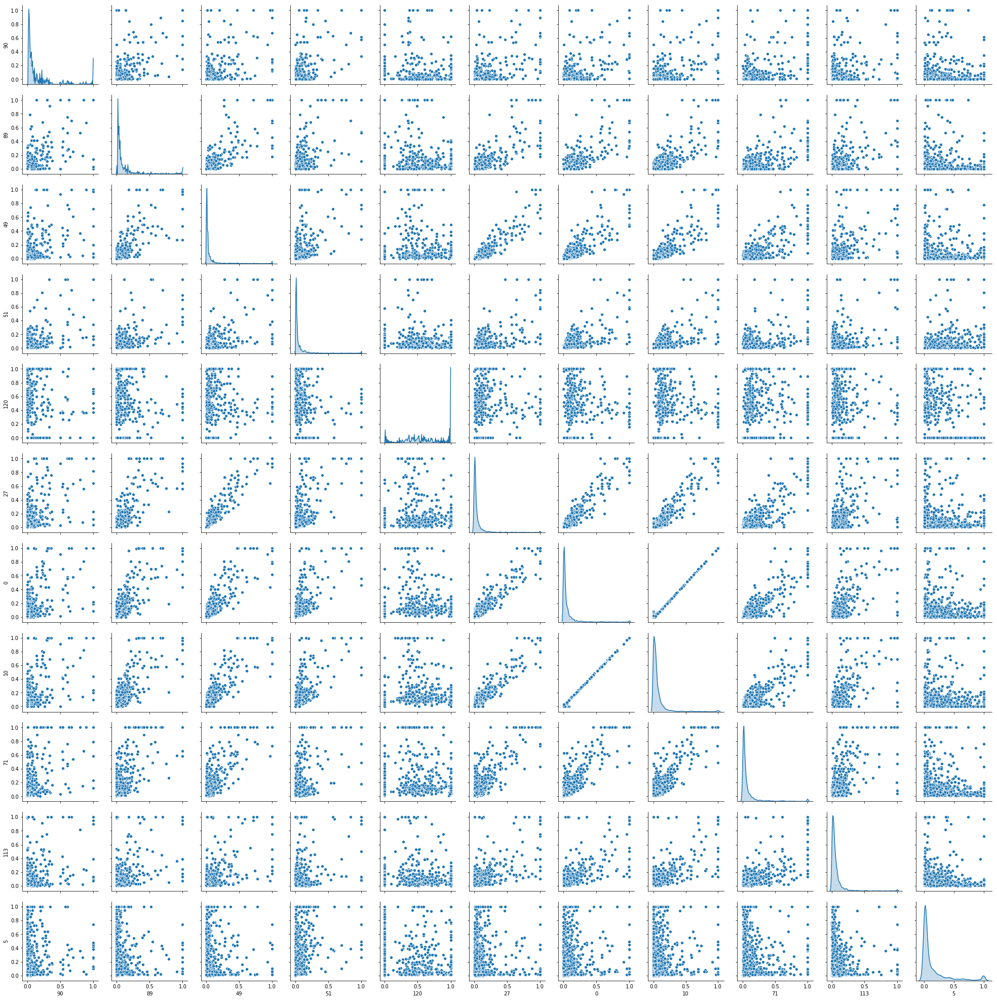

In [9]:
plt.figure(figsize=(10,10))
sns.pairplot(top_a_data,diag_kind='kde')
plt.show()

From the sactter plot, we can find that No. 56,57,58 features may have multicollinearity， which may cause a low significance for these 3 features. And for No. 2,5,115,61 features, they have a relative low correlation with depenedent variables. While for No.120,90,89,49, it seems there are no relations with depenedent variables.

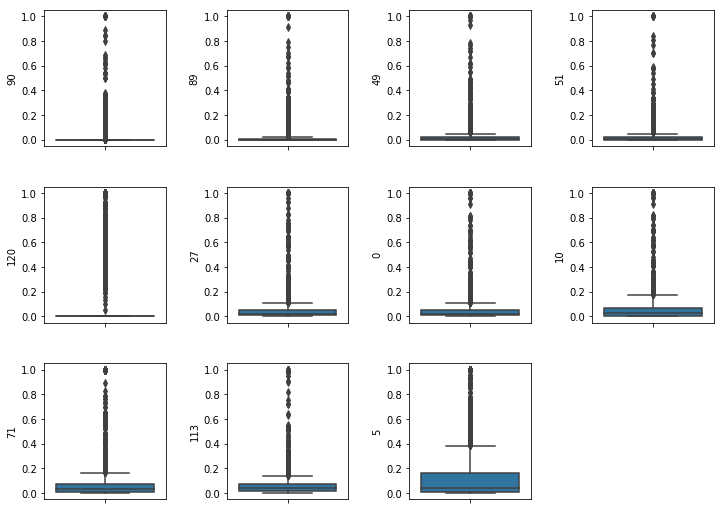

In [10]:
plt.figure(figsize=(12,9))
error_=0.018
plt.subplots_adjust(hspace=0.3, wspace=0.5)
arrange=0
for attr in top_a_data:
        arrange += 1
        plt.subplot(3,4,arrange)
        sns.boxplot(data=top_a_data,y=attr)

In [11]:
train_data=data.iloc[:1494]
test_data=data.iloc[1495:]

In [12]:
trainX=train_data.drop([122],axis=1)
trainY=train_data[122]


In [13]:
testX=test_data.drop([122],axis=1)
testY=test_data[122]


(f) Fit a linear model using least squares to the training set and report the test error.

In [14]:

model=LinearRegression()
model=model.fit(trainX,trainY)
prediction=model.predict(testX)
error = mean_squared_error(testY,prediction)
print("Test MSE for Linear Regression is",error_)

Test MSE for Linear Regression is 0.018


(g) Fit a ridge regression model on the training set, with λ chosen by cross-validation. Report the test error obtained.

In [15]:
alpha=[0.001,0.01,0.1,1]
model2=RidgeCV(alphas=alpha, cv = 10).fit(trainX,trainY)
prediction2=model2.predict(testX)
error2=mean_squared_error(testY,prediction2)
ridge_alpha=model2.alpha_
print("Test MSE for ridge regression model ",error2)

Test MSE for ridge regression model  0.017735006961111945


(h) Fit a LASSO model on the training set, with λ chosen by cross-validation.

In [16]:
model3=LassoCV(alphas=alpha, cv = 10, random_state=0)
model3=model3.fit(trainX,trainY)
prediction3=model3.predict(testX)
lasso_alpha = model3.alpha_
error3 = mean_squared_error(testY,prediction3)
print("MSE for lasso model ",error3)

MSE for lasso model  0.01755387576635201


In [17]:
features=[]
for i in range(1,data.shape[1]-1):
    if model3.coef_[i]!= 0:
        features.append(str(i))
print('Variables Selected by the Model: ')
print(features)

Variables Selected by the Model: 
['2', '3', '7', '11', '17', '24', '38', '44', '45', '48', '50', '59', '68', '71', '72', '74', '86', '88', '90', '91', '119', '120']


In [18]:
scaler = preprocessing.StandardScaler()
scaled_X_train = scaler.fit_transform(trainX)
scaled_X_test = scaler.fit_transform(testX)
model4 = LassoCV(alphas=alpha, cv = 10, random_state=0, normalize=True)
model4=model4.fit(trainX,trainY)
prediction4 = model4.predict(testX)
lasso_alpha_2 = model4.alpha_
error4 = mean_squared_error(testY,prediction4)
print("MSE for lasso model with standardized features", error4)

MSE for lasso model with standardized features 0.019769486939643838


In [19]:
features=[]
for i in range(0,data.shape[1]-1):
    if model4.coef_[i]!= 0:
        features.append(str(i))
print('Variables Selected by the Model: ')
print(features)

Variables Selected by the Model: 
['3', '40', '44', '50', '71']


The test error with standardized features was slightly higher than the test error without standardization. With standaridzed features, the test MSE was 0.019769, while it was 0.01755 without standardization. There is only a slight difference in test error between these two cases, but a potential reason that standardization did not significantly impact the error is because the data was already normalized.

(i) Fit a PCR model on the training set, with M chosen by cross-validation.

In [20]:
error_mse=[]

In [21]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
for i in range(1,123,1):
    curr_data=scaler.fit_transform(trainX)
    pca=PCA(n_components=i)
    reduced_feature_data=pca.fit_transform(curr_data)
    model=LinearRegression()
    curr_error = (model_selection.cross_validate(model, reduced_feature_data, trainY,cv=10,scoring='neg_mean_squared_error',return_train_score=True)['test_score']*(-1)).mean()
    error_mse.append(curr_error)


In [22]:
min_error=min(error_mse)
min_index=error_mse.index(min_error)+1

In [23]:
print("Lowest train error possible is", (min_error), "at no.  of components ",min_index)

Lowest train error possible is 0.0193759931501095 at no.  of components  95


In [24]:
pca=PCA(n_components=min_index)
curr_data=scaler.fit_transform(trainX)
curr_test=scaler.fit_transform(testX)
reduced_train_data=pca.fit_transform(curr_data)
reduced_test_data=pca.fit_transform(curr_test)

In [25]:
model5=LinearRegression()
model5=model5.fit(reduced_train_data,trainY)

In [26]:
prediction5=model5.predict(reduced_test_data)
error5=mean_squared_error(testY,prediction5)

In [27]:
print("Test error is", (error5), "at no.  of components ",min_index)

Test error is 0.0441718090107767 at no.  of components  95


(j) Fit a boosting tree to the data.¶

In [28]:
from xgboost import XGBRegressor

In [29]:
param = {'max_depth':2, 'reg_alpha':a, 'silent':1, 'objective':'reg:logistic'}
score=[]
for a in alpha:
    curr_model=XGBRegressor(**param)
    cv_score=model_selection.cross_validate(curr_model,trainX,trainY,return_train_score=True,cv=10)
    cv_score=(cv_score['test_score']*(-1)).mean()
    score.append(cv_score)
max_score=max(score)
max_index=score.index(max_score)
best_alpha=alpha[max_index]
print(best_alpha)

0.001


In [30]:
xgb = XGBRegressor(reg_alpha = best_alpha)
xgb.fit(trainX, trainY)
pred = xgb.predict(testX)
mse_xgb = mean_squared_error(testY, pred)

print('The test MSE is:', mse_xgb)

[17:07:26] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
The test MSE is: 0.01675643373305092



2. Tree-Based Methods


    (a) Download the APS Failure data

        The training set contains 60,000 rows, of which 1,000 belong to the positive class and 171 columns, of which one is the class column.


In [51]:
train_data=pd.read_csv('C:\\Users\\D\\Downloads\\aps_failure_training_set.csv',sep=",",header=14)
test_data=pd.read_csv('C:\\Users\\D\\Downloads\\aps_failure_test_set.csv',sep=",",header=14)


(bi) Research what types of techniques are usually used for dealing with data with missing values

Dealing with data with missing values will depend on the type of missing data. There are three types of missing data:

    Missing Completely at Random -- no pattern in missing data on any variables
    Missing at Random -- there is a pattern in missing data, but not on primary dependent variable
    Missing Not at Random -- there is a pattern in missing data that affects the primary depdent variables

For the first two types, we can remove the data with missing values depending on their occurence. The deletion can be done by listwise deletion, pairwise deletion or deleting columns. However, for the third type, removing observations with missing values can produce a bias in the model. A basic imputation method is computing overall mean, median, or mode. This is a fast and simple method, but mean imputation reduces variance in the dataset. We could also train a classifier using observations without missing values in order to predict the missing values. For example, a linear regression could be used to predict continuous values and KNN could be used to predict categorical or continuous values.

https://towardsdatascience.com/how-to-handle-missing-data-8646b18db0d4

https://measuringu.com/handle-missing-data/


In [52]:
train_data = train_data.applymap(lambda x: np.nan if x == 'na' else x)
train_data = train_data.apply(pd.to_numeric, errors='ignore')
train_data = train_data.fillna(value = train_data.mean(), axis=0)

test_data = test_data.applymap(lambda x: np.nan if x == 'na' else x)
test_data = test_data.apply(pd.to_numeric, errors='ignore')
test_data = test_data.fillna(value = test_data.mean(), axis=0)



(bii) For each of the 170 features, calculate the coefficient of variation CV = s , m where s is sample variance and m is sample mean.

In [53]:
total_data=pd.concat([train_data,test_data])

In [54]:
std_tree=total_data.std()
mean_tree=total_data.mean()
cv_tree=std_tree/mean_tree
print(pd.DataFrame(cv_tree, columns=["CV"]))

                CV
aa_000    4.328608
ab_000    2.178397
ac_000    2.167648
ad_000  206.786809
ae_000   22.293998
af_000   18.209361
ag_000   91.465520
ag_001   42.080340
ag_002   17.624927
ag_003    8.753069
ag_004    5.475050
ag_005    2.964212
ag_006    2.352582
ag_007    2.812494
ag_008    6.274974
ag_009   32.166624
ah_000    2.315537
ai_000   18.506576
aj_000   43.144685
ak_000   78.624114
al_000    9.112035
am_0      9.067286
an_000    2.254231
ao_000    2.276109
ap_000    3.085891
aq_000    2.853462
ar_000   10.569373
as_000  113.895899
at_000   23.187192
au_000   86.090347
...            ...
dl_000   37.456075
dm_000   34.552278
dn_000    2.875132
do_000    2.174414
dp_000    2.009312
dq_000   21.186232
dr_000    6.586012
ds_000    2.289954
dt_000    2.165080
du_000    2.796120
dv_000    3.452116
dx_000    5.105342
dy_000    7.516804
dz_000   49.253005
ea_000   32.778551
eb_000    4.541983
ec_00     2.378550
ed_000    2.250536
ee_000    3.369182
ee_001    3.235221
ee_002    2.

(biii) Plot a correlation matrix for your features using pandas or any other tool.

In [55]:
print(total_data.corr())

          aa_000    ab_000    ac_000    ad_000    ae_000    af_000    ag_000  \
aa_000  1.000000  0.019908 -0.011646 -0.000574  0.025784  0.035977  0.011681   
ab_000  0.019908  1.000000 -0.010893  0.000026  0.024889  0.043279  0.000557   
ac_000 -0.011646 -0.010893  1.000000 -0.002032 -0.004769 -0.010612  0.015535   
ad_000 -0.000574  0.000026 -0.002032  1.000000 -0.000193 -0.000234 -0.000041   
ae_000  0.025784  0.024889 -0.004769 -0.000193  1.000000  0.829986 -0.000441   
af_000  0.035977  0.043279 -0.010612 -0.000234  0.829986  1.000000 -0.000540   
ag_000  0.011681  0.000557  0.015535 -0.000041 -0.000441 -0.000540  1.000000   
ag_001  0.076379  0.006667 -0.002333 -0.000054 -0.000609 -0.000738  0.216332   
ag_002  0.195163  0.023633 -0.009436 -0.000123  0.001946  0.004358  0.140260   
ag_003  0.307445  0.035837 -0.022885 -0.000256  0.020674  0.030816  0.079367   
ag_004  0.357458  0.036372 -0.032630 -0.000421  0.047653  0.068850  0.057094   
ag_005  0.445900  0.030884 -0.018702 -0.

In [56]:
a=math.floor(math.sqrt(170))
cv_tree.sort_values(ascending=False,inplace=True)
highest_a_cv_values=cv_tree[0:a]
highest_a_cv_values

cf_000    207.335930
co_000    206.941549
ad_000    206.786809
cs_009    192.498194
dj_000    122.169994
as_000    113.895899
dh_000    112.666588
df_000    111.279258
ag_000     91.465520
au_000     86.090347
ak_000     78.624114
az_009     78.005605
ay_009     77.461293
dtype: float64

In [57]:
top_a_data = total_data[highest_a_cv_values.index]
temp_a_data=top_a_data
top_a_data['class'] = total_data['class']

<Figure size 864x864 with 0 Axes>

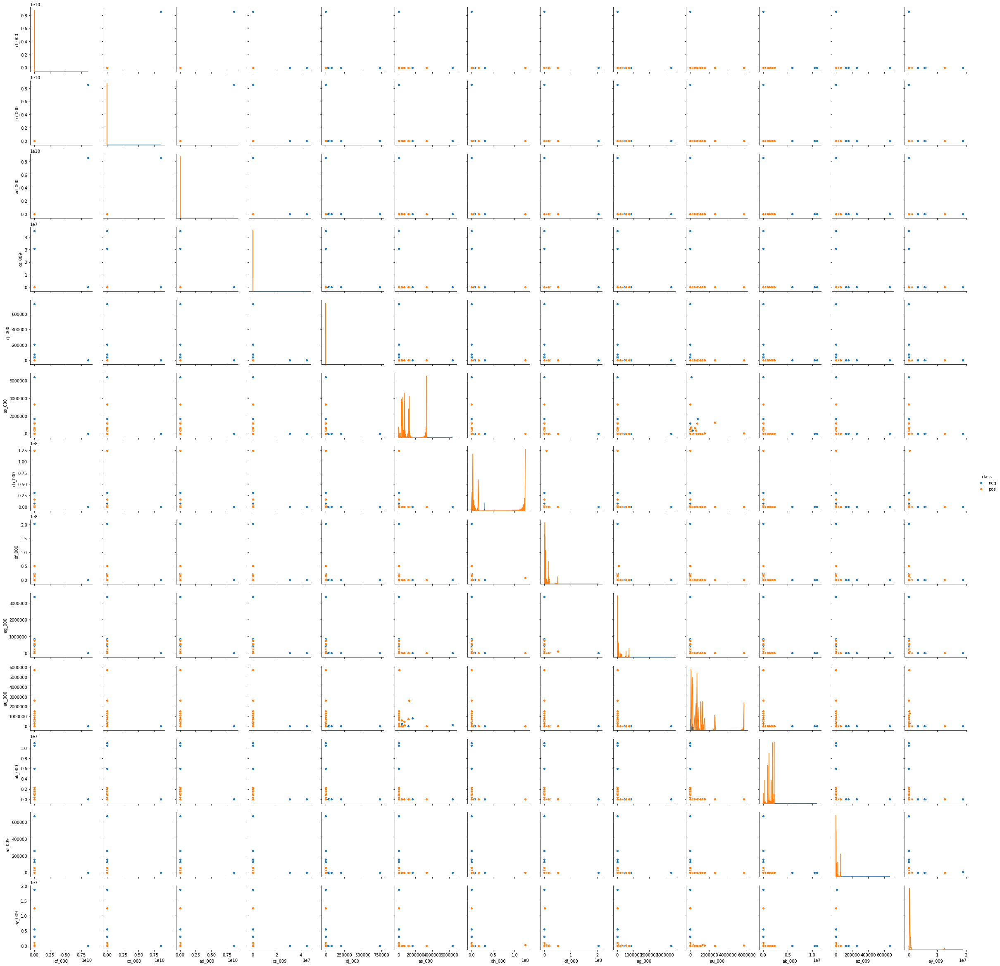

In [40]:

plt.figure(figsize=(10,10))
sns.pairplot(top_a_data,diag_kind='kde',hue='class')
plt.show()

Based on the scatterplots, there are positive correlations between dq_000 and du_000 as well as dq_000 and bb_000. du_000 and bb_000 seem to be slightly correlated with each other. There also could potentially be a correlation between bb_000 and eb_000.

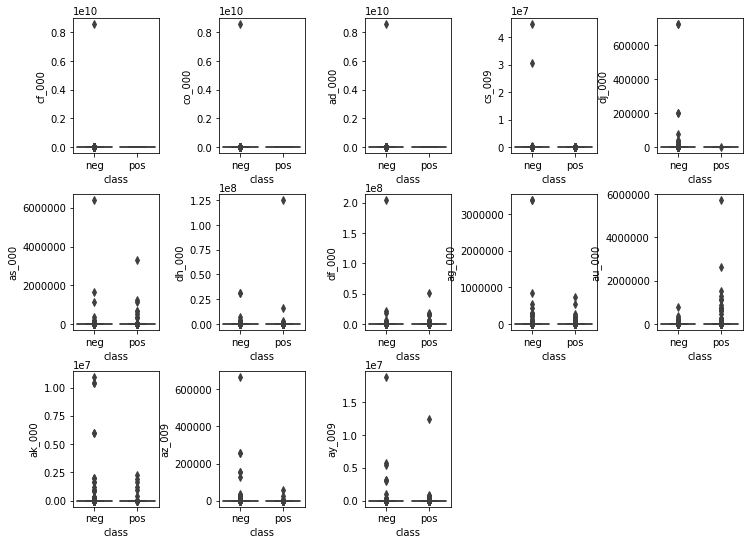

In [44]:

# tree_first_13 = np.argsort(-cv_tree)[0:13]
# tree_first_13 = list(tree_first_13.index)
# tree_first_13_data = total_data[tree_first_13]
# tree_first_13_data['class'] = total_data['class']
# plt.figure(figsize=(12,9))
# plt.subplots_adjust(hspace=0.3, wspace=0.7)
# arrange = 0
for attr in temp_a_data:
    arrange += 1
    plt.subplot(3,5,arrange)
    sns.boxplot(data=top_a_data,x='class',y=attr)

bv) Determine the number of positive and negative data.

In [58]:
neg_count = total_data[total_data['class'] == 'neg'].shape[0]
pos_count = total_data[total_data['class'] == 'pos'].shape[0]

print("Negative data",neg_count)
print("Positive data",pos_count)
print("The data is imbalanced since negative data is more than 95 % of data whereas positive data is only a small percentage")

Negative data 74625
Positive data 1375
The data is imbalanced since negative data is more than 95 % of data whereas positive data is only a small percentage


c)Train a random forest to classify the data set. Do NOT compensate for classimbalance in the data set. Calculate the confusion matrix, ROC, AUC, andmisclassification for training and test sets and report them (You may use pROCpackage). Calculate Out of Bag error estimate for your random forset and compareit to the test error.

In [60]:
from sklearn.ensemble import RandomForestClassifier
new_train=train_data.replace('pos',1)
new_train=new_train.replace('neg',0)
new_test=test_data.replace('pos',1)
new_test=new_test.replace('neg',0)

new_trainX=new_train.drop(['class'],axis=1)
new_trainY=new_train['class']
new_testX=new_test.drop(['class'],axis=1)
new_testY=new_test['class']

model6=RandomForestClassifier(n_estimators=100,oob_score=True,random_state=0,max_depth=2)
model6=model6.fit(new_trainX,new_trainY)

pred6=model6.predict(new_trainX)

con_mat=confusion_matrix(new_trainY,pred6)

tn=con_mat[0][0]
fp=con_mat[0][1]
fn=con_mat[1][0]
tp=con_mat[1][1]

print("True Negative data",tn)
print("True Positive data",tp)
print("False Negative data",fn)
print("False Positive data",fp)

True Negative data 58978
True Positive data 188
False Negative data 812
False Positive data 22


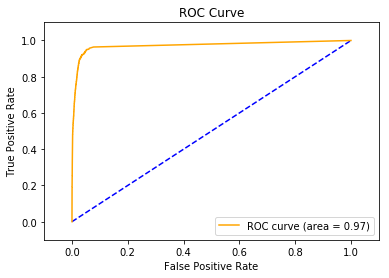

In [61]:
falposrate,truposrate,thresh=roc_curve(new_trainY,model6.predict_proba(new_trainX)[:,1])
plt.figure()
plt.plot([0, 1], [0, 1], color='blue',  linestyle='--')
plt.plot(falposrate, truposrate, color='orange', label='ROC curve (area = %0.2f)' % auc(falposrate,truposrate))



plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

In [62]:

missclass_rate = 1 - model6.score(new_trainX,new_trainY)
print("The misclassification rate for training dataset is ", missclass_rate)

The misclassification rate for training dataset is  0.013900000000000023


In [63]:

pred6=model6.predict(new_testX)

con_mat=confusion_matrix(new_testY,pred6)

tn=con_mat[0][0]
fp=con_mat[0][1]
fp=con_mat[1][0]
tp=con_mat[1][1]

print("True Negative data",tn)
print("True Positive data",tp)
print("False Negative data",fn)
print("False Positive data",fp)

True Negative data 15624
True Positive data 71
False Negative data 812
False Positive data 304


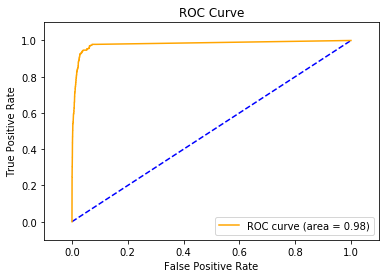

In [64]:
falposrate,truposrate,thresh=roc_curve(new_testY,model6.predict_proba(new_testX)[:,1])
plt.figure()
plt.plot([0, 1], [0, 1], color='blue',  linestyle='--')
plt.plot(falposrate, truposrate, color='orange', label='ROC curve (area = %0.2f)' % auc(falposrate,truposrate))



plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

In [65]:
missclass_rate = 1 - model6.score(new_testX,new_testY)
print("The misclassification rate for test dataset is ", missclass_rate)

The misclassification rate for test dataset is  0.019062499999999982


In [66]:
oob_error=1-model6.oob_score_
print("The oob error is ", oob_error)
print("The oob error is less than the test error ")


The oob error is  0.014100000000000001
The oob error is less than the test error 


(d) Compensate for class imbalance in your random forest and repeat 2c.

In [69]:
model7=RandomForestClassifier(n_estimators=100,oob_score=True,random_state=0,max_depth=2,class_weight="balanced")
model7=model7.fit(new_trainX,new_trainY)

pred7=model7.predict(new_trainX)

con_mat=confusion_matrix(new_trainY,pred7)

tn=con_mat[0][0]
fp=con_mat[0][1]
fn=con_mat[1][0]
tp=con_mat[1][1]

print("True Negative data",tn)
print("True Positive data",tp)
print("False Negative data",fn)
print("False Positive data",fp)

True Negative data 55201
True Positive data 947
False Negative data 53
False Positive data 3799


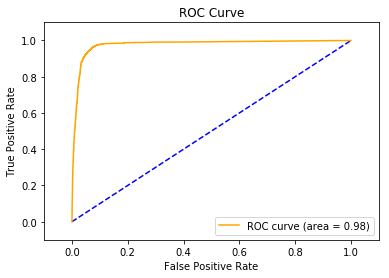

In [70]:
falposrate,truposrate,thresh=roc_curve(new_trainY,model7.predict_proba(new_trainX)[:,1])
plt.figure()
plt.plot([0, 1], [0, 1], color='blue',  linestyle='--')
plt.plot(falposrate, truposrate, color='orange', label='ROC curve (area = %0.2f)' % auc(falposrate,truposrate))



plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

In [71]:
missclass_rate = 1 - model7.score(new_trainX,new_trainY)
print("The misclassification rate for training dataset is ", missclass_rate)

The misclassification rate for training dataset is  0.06420000000000003


In [72]:
pred7=model7.predict(new_testX)

con_mat=confusion_matrix(new_testY,pred7)

tn=con_mat[0][0]
fp=con_mat[0][1]
fp=con_mat[1][0]
tp=con_mat[1][1]

print("True Negative data",tn)
print("True Positive data",tp)
print("False Negative data",fn)
print("False Positive data",fp)

True Negative data 14674
True Positive data 363
False Negative data 53
False Positive data 12


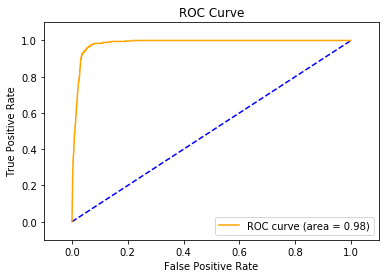

In [73]:
falposrate,truposrate,thresh=roc_curve(new_testY,model7.predict_proba(new_testX)[:,1])
plt.figure()
plt.plot([0, 1], [0, 1], color='blue',  linestyle='--')
plt.plot(falposrate, truposrate, color='orange', label='ROC curve (area = %0.2f)' % auc(falposrate,truposrate))



plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

In [74]:
missclass_rate = 1 - model7.score(new_testX,new_testY)
print("The misclassification rate for test dataset is ", missclass_rate)

The misclassification rate for test dataset is  0.06018749999999995


In [75]:
oob_error=1-model7.oob_score_
print("The oob error is ", oob_error)
print("The oob error is slightly more than the test error ")


The oob error is  0.06428333333333336
The oob error is slightly more than the test error 


The balanced tree performs worse than the unbalanced tree as expected.
The random forest addressing part of the imbalanced data by assign weights for each class based on the size of each class. From the result, the result of model handling imbalanced dataset improves slightly. The misclassification rate of positive data decreases while that of negative data increases.

e)Model TreesIn the case of a univariate tree, only one input dimension is used at a tree split.In a multivariate tree, or model tree, at a decision node all input dimensions canbe used and thus it is more general. In univariate classification trees, majoritypolling is used at each node to determine the split of that node as the decisionrule. In model trees, a (linear) model that relies on all of the variables is used to determine the split of that node (i.e. instead of usingXj> sas the decisionrule, one hasPjβjXj> s. as the decision rule). Alternatively, in a regressiontree, instead of using average in the region associated with each node, a linearregression model is used to determine the value associated with that node.One of the methods that can be used at each node is Logistic Regression. Onecan use scikit learn to call Weka7to train Logistic Model Trees for classification.Train Logistic Model Trees for the APS data set without compensation for classimbalance. Use one of 5 fold, 10 fold, and leave-one-out cross validation methodsto estimate the error of your trained model and compare it with the test error.Report the Confusion Matrix, ROC, and AUC for training and test sets.

In [1]:
import weka.core.jvm as jvm
jvm.start(packages=True)
from weka.core.converters import Loader
from weka.classifiers import Classifier
from weka.classifiers import Evaluation
from weka.classifiers import Random
from weka.plot.classifiers import plot_roc

DEBUG:weka.core.jvm:Adding bundled jars
DEBUG:weka.core.jvm:Classpath=['/Users/shannontee/miniconda3/envs/myenv/lib/python3.6/site-packages/javabridge/jars/rhino-1.7R4.jar', '/Users/shannontee/miniconda3/envs/myenv/lib/python3.6/site-packages/javabridge/jars/runnablequeue.jar', '/Users/shannontee/miniconda3/envs/myenv/lib/python3.6/site-packages/javabridge/jars/cpython.jar', '/Users/shannontee/miniconda3/envs/myenv/lib/python3.6/site-packages/weka/lib/python-weka-wrapper.jar', '/Users/shannontee/miniconda3/envs/myenv/lib/python3.6/site-packages/weka/lib/weka.jar']
DEBUG:weka.core.jvm:MaxHeapSize=default
DEBUG:weka.core.jvm:Package support enabled


In [58]:
new_train=train_data["class"].replace(1,'pos')
new_train=new_train["class"].replace(0,'neg')
new_test=test_data["class"].replace(1,'pos')
new_test=new_test["class"].replace(0,'neg')

In [ ]:
new_train.to_csv('new_train.csv', index=False)
loader = Loader(classname="weka.core.converters.CSVLoader")

In [ ]:
new_train = loader.load_file("new_train.csv")
new_train.class_is_first()

In [ ]:
clf=Classifier(classname="weka.classifiers.trees.LMT")
evaluation=Evaluation(new_train)
evaluation.crossvalidate_model(clf, new_train, 5, Random(1))

In [61]:
new_train.to_csv('new_train.csv', index=False)
loader = Loader(classname="weka.core.converters.CSVLoader")
train = loader.load_file("new_train.csv")
train.class_is_first()

In [62]:
clf = Classifier(classname="weka.classifiers.trees.LMT")
evaluation1 = Evaluation(train)
evaluation1.crossvalidate_model(clf, train, 5, Random(1))

In [63]:
# calculate the summary here
print('Training Set Summary')
print(evaluation1.summary())



Training Set Summary

Correctly Classified Instances       59504               99.1733 %
Incorrectly Classified Instances       496                0.8267 %
Kappa statistic                          0.7194
Mean absolute error                      0.0118
Root mean squared error                  0.0822
Relative absolute error                 35.8868 %
Root relative squared error             64.1759 %
Total Number of Instances            60000     



In [64]:
#CONFUSION MATRIX
print('Training Set:')
print(evaluation1.matrix())

Training Set:
=== Confusion Matrix ===

     a     b   <-- classified as
 58855   145 |     a = neg
   351   649 |     b = pos



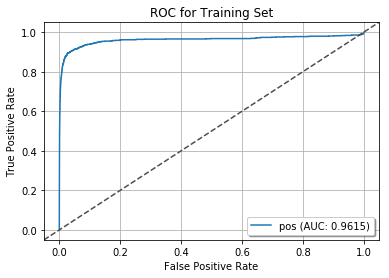

In [65]:
#ROC CURVE
plot_roc(evaluation1, title='ROC for Training Set', class_index=[1], wait=False)

In [ ]:
new_test.to_csv('new_test.csv', index=False)
loader = Loader(classname="weka.core.converters.CSVLoader")

In [ ]:
test_me = loader.load_file('new_test.csv')
test_me.class_is_first()

In [ ]:
clf = Classifier(classname="weka.classifiers.trees.LMT")

In [ ]:
clf.build_classifier(train)

In [ ]:
evaluation2 = Evaluation(train)

In [32]:
evaluation2.test_model(clf, test_me)

array([0., 0., 0., ..., 0., 0., 0.])

In [51]:
print('Testing Set Summary')
print(evaluation2.summary())

Testing Set Summary

Correctly Classified Instances       15844               99.025  %
Incorrectly Classified Instances       156                0.975  %
Kappa statistic                          0.7643
Mean absolute error                      0.0133
Root mean squared error                  0.0893
Relative absolute error                 33.8486 %
Root relative squared error             58.9356 %
Total Number of Instances            16000     



In [48]:
print('Testing Set')
print(evaluation2.matrix())

Testing Set
=== Confusion Matrix ===

     a     b   <-- classified as
 15584    41 |     a = neg
   115   260 |     b = pos



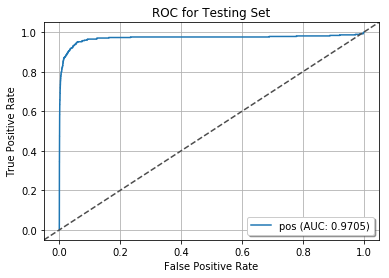

In [49]:
plot_roc(evaluation2, title='ROC for Testing Set', class_index=[1], wait=False)

The training set performed slightly better than the test set since it was able to classify more instances correctly and had a lower MSE. However, the difference in error between these two was really small.

(f)Use SMOTE (Synthetic Minority Over-sampling Technique) to pre-process yourdata to compensate for class imbalance.8Train a Logistic Model Tree using thepre-processed data and repeat 2e. Do not forget that there is a right and a wrongway of cross validation here. Compare the uncompensated case with SMOTE

In [45]:
from imblearn.over_sampling import SMOTE

In [46]:
sm = SMOTE()

In [ ]:
new_train_y=new_train["class"]
new_train_x=new_train.drop(["class"],axis=1)

In [ ]:
new_test_y=new_test["class"]
new_test_x=new_test.drop(["class"],axis=1)

In [ ]:
new_train_x_sm,new_train_y_sm = sm.fit_sample(new_train_x, new_train_y.values.ravel())
new_test_x_sm,new_test_y_sm = sm.fit_sample(new_test_x, new_test_y.values.ravel())

In [ ]:
new_train_x_sm = pd.DataFrame(new_train_x_sm)
new_train_y_sm = pd.DataFrame(new_train_y_sm, columns=['class'])
new_train_x_sm['class'] = new_train_y_sm['class']

In [ ]:
new_test_x_sm = pd.DataFrame(new_test_x_sm)
new_test_y_sm = pd.DataFrame(new_test_y_sm, columns=['class'])
new_test_x_sm['class'] = new_test_y_sm['class']

In [ ]:
new_train_x_sm.to_csv('new_train_x_sm.csv', index=False)
loader = Loader(classname="weka.core.converters.CSVLoader")

In [ ]:
new_train_x_sm_res = loader.load_file("new_train_x_sm.csv")
new_train_x_sm_res.class_is_last()

In [71]:
clf = Classifier(classname="weka.classifiers.trees.LMT")

In [ ]:
evaluation3 = Evaluation(new_train_x_sm_res)
evaluation3.crossvalidate_model(clf, new_train_x_sm_res, 5, Random(1))

In [73]:
print('Training Set with SMOTE Summary')
print(evaluation3.summary())

Training Set with SMOTE Summary

Correctly Classified Instances      116123               98.4093 %
Incorrectly Classified Instances      1877                1.5907 %
Kappa statistic                          0.9682
Mean absolute error                      0.0266
Root mean squared error                  0.115 
Relative absolute error                  5.3299 %
Root relative squared error             23.0058 %
Total Number of Instances           118000     



In [74]:
print('Training Set with SMOTE')
print(evaluation3.matrix())

Training Set with SMOTE
=== Confusion Matrix ===

     a     b   <-- classified as
 57978  1022 |     a = neg
   855 58145 |     b = pos



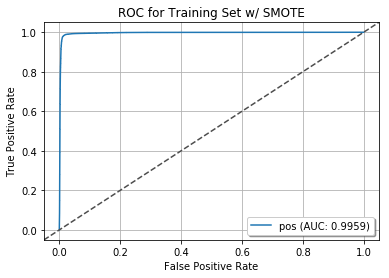

In [75]:
plot_roc(evaluation3, title='ROC for Training Set w/ SMOTE', class_index=[1], wait=False)

In [ ]:
new_test_x_sm.to_csv('new_test_x_sm.csv', index=False)

In [43]:
loader = Loader(classname="weka.core.converters.CSVLoader")


In [ ]:
new_test_x_sm_res = loader.load_file("new_test_x_sm.csv")
new_test_x_sm_res.class_is_last()

In [45]:
clf = Classifier(classname="weka.classifiers.trees.LMT")
clf.build_classifier(new_test_x_sm_res)
evaluation4 = Evaluation(new_test_x_sm_res)
evaluation4.test_model(clf, new_test_x_sm_res)

array([0., 0., 0., ..., 0., 1., 1.])

In [72]:
print('Testing Set with SMOTE Summary')
print(evaluation4.summary())

Testing Set with SMOTE Summary

Correctly Classified Instances       29730               95.136  %
Incorrectly Classified Instances      1520                4.864  %
Kappa statistic                          0.9027
Mean absolute error                      0.0559
Root mean squared error                  0.2081
Relative absolute error                 11.182  %
Root relative squared error             41.6261 %
Total Number of Instances            31250     



In [53]:
print('Testing Set')
print(evaluation4.matrix())

Testing Set
=== Confusion Matrix ===

     a     b   <-- classified as
 15207   418 |     a = neg
  1102 14523 |     b = pos



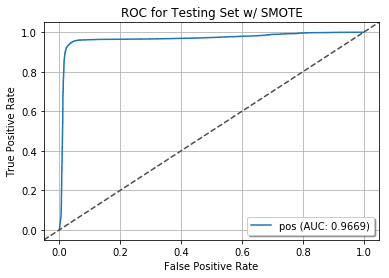

In [54]:
plot_roc(evaluation4, title='ROC for Testing Set w/ SMOTE', class_index=[1], wait=False)

mse for train/test is better for uncompensated than with smote. auc for train set of smote is better than auc for uncompensated while auc for test of smote is worse than auc for uncompensated.

#  ISLR 6.8.3
a

(iv) Steadily decreases: As we increase s
from 0, all β 's increase from 0 to their least square estimate values. Training error for 0 β

s is the maximum and it steadily decreases to the Ordinary Least Square RSS
b

(ii) Decrease initially, and then eventually start increasing in a U shape: When s=0
, all β s are 0, the model is extremely simple and has a high test RSS. As we increase s, beta s assume non-zero values and model starts fitting well on test data and so test RSS decreases. Eventually, as beta

s approach their full blown OLS values, they start overfitting to the training data, increasing test RSS.
c

(iii) Steadily increase: When s=0
, the model effectively predicts a constant and has almost no variance. As we increase s, the models includes more β s and their values start increasing. At this point, the values of β

s become highly dependent on training data, thus increasing the variance.
d

(iv) Steadily decrease: When s=0
, the model effectively predicts a constant and hence the prediction is far from actual value. Thus bias is high. As s increases, more β

s become non-zero and thus the model continues to fit training data better. And thus, bias decreases.
e

(v) Remains constant: By definition, irreducible error is model independent and hence irrespective of the choice of s
, remains constant.
#  ISLR, 6.8.5
a)
Minimize: (y1−β^1x11−β^2x12)2+(y2−β^1x21−β^2x22)2+λ(β^21+β^22)

b)
Now we are given that, x11=x12=x1 and x21=x22=x2. We take derivatives of above expression with respect to both β1^ and β2^ and setting them equal to zero find that, β∗^1=x1y1+x2y2−β∗^2(x21+x22)λ+x21+x22 and β∗^2=x1y1+x2y2−β∗^1(x21+x22)λ+x21+x22 .Symmetry in these expressions suggests that β∗^1=β∗^2

c)
Minimize: (y1−β^1x11−β^2x12)2+(y2−β^1x21−β^2x22)2+λ(|β^1|+|β^2|)

d)
Here is a geometric interpretation of the solutions for the equation in c above. We use the alternate form of Lasso constraints |β^1|+|β^2|<sThe Lasso constraint take the form |β^1|+|β^2|<s
, which when plotted take the familiar shape of a diamond centered at origin (0,0). Next consider the squared optimization constraint (y1−β^1x11−β^2x12)2+(y2−β^1x21−β^2x22)2. We use the facts x11=x12, x21=x22, x11+x21=0, x12+x22=0 and y1+y2=0 to simplify it to Minimize: 2.(y1−(β^1+β^2)x11)2 .This optimization problem has a simple solution: β^1+β^2=y1x11. This is a line parallel to the edge of Lasso-diamond β^1+β^2=s. Now solutions to the original Lasso optimization problem are contours of the function (y1−(β^1+β^2)x11)2 that touch the Lasso-diamond β^1+β^2=s. Finally, as β^1 and β^2 very along the line β^1+β^2=y1x11, these contours touch the Lasso-diamond edge β^1+β^2=s at different points. As a result, the entire edge β^1+β^2=s is a potential solution to the Lasso optimization problem!
Similar argument can be made for the opposite Lasso-diamond edge: β^1+β^2=−s.
Thus, the Lasso problem does not have a unique solution. The general form of solution is given by two line segments:
β^1+β^2=s;β^1≥0;β^2≥0
and β^1+β^2=−s;β^1≤0;β^2≤0

# ISLR 8.4.5
The number of red predictions is greater than the number of green predictions based on a 50% threshold, thus RED.

The average of the probabilities is less than the 50% threshold, thus GREEN.
# ISLR 9.7.3



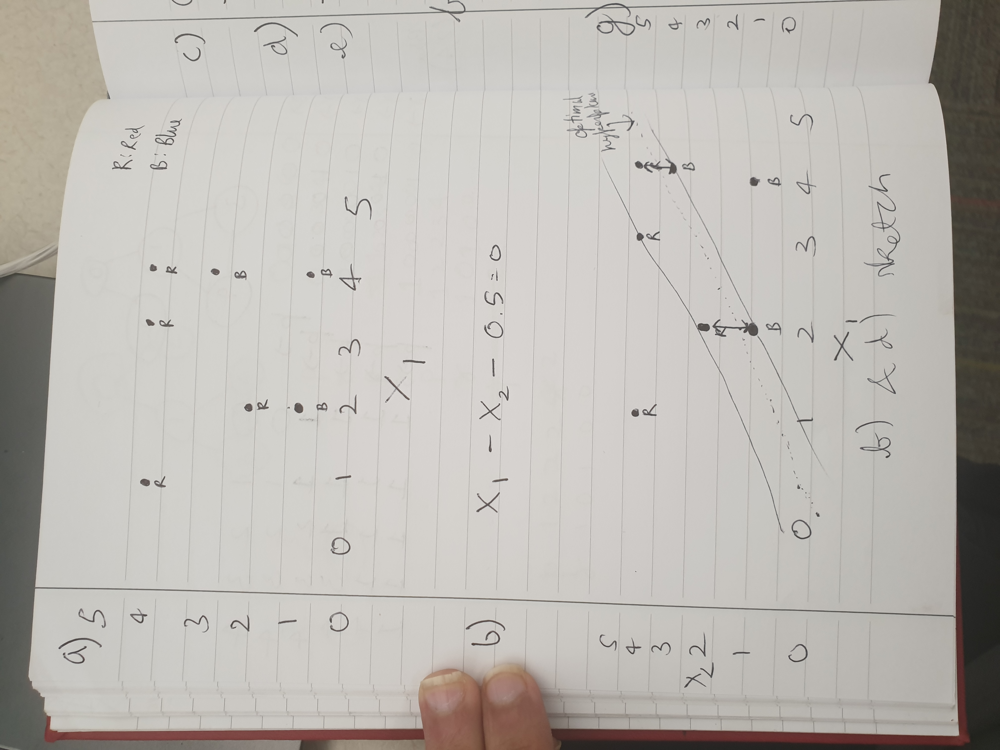

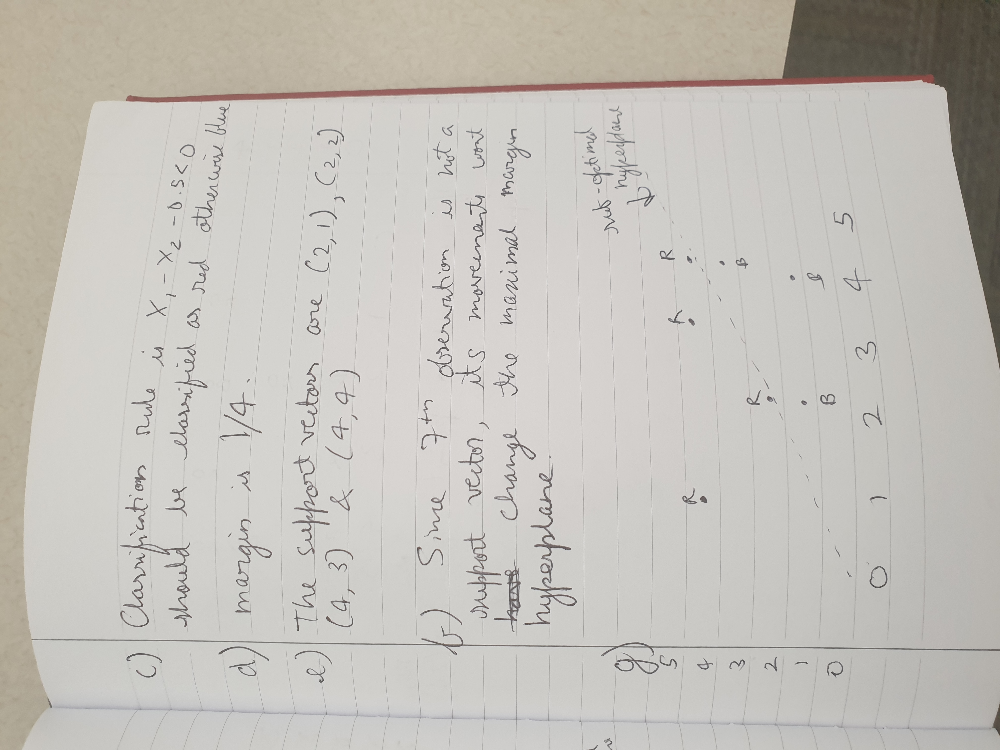

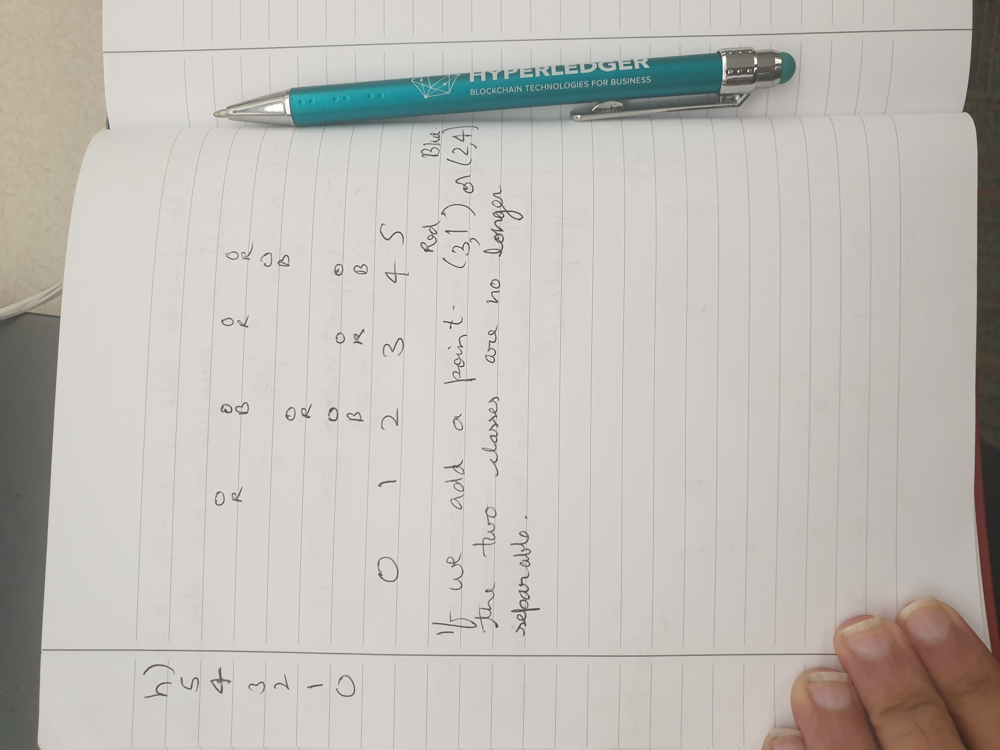